# Dataset Preprocess

In [3]:
! wget https://dept-info.labri.fr/~mansenca/ENSEIRB2024_2025/GITW_light.zip

--2025-01-10 09:34:34--  https://dept-info.labri.fr/~mansenca/ENSEIRB2024_2025/GITW_light.zip
Résolution de dept-info.labri.fr (dept-info.labri.fr)… 147.210.9.83, 2001:660:6101:404::2:80
Connexion à dept-info.labri.fr (dept-info.labri.fr)|147.210.9.83|:443… connecté.
requête HTTP transmise, en attente de la réponse… 200 OK
Taille : 1793495430 (1,7G) [application/zip]
Enregistre : ‘GITW_light.zip’

GITW_light.zip      100%[===================>]   1,67G  48,1MB/s    ds 36s     

2025-01-10 09:35:11 (46,9 MB/s) - ‘GITW_light.zip’ enregistré [1793495430/1793495430]



In [4]:
! unzip GITW_light.zip

Archive:  GITW_light.zip
   creating: GITW_light/
   creating: GITW_light/test/
   creating: GITW_light/test/MilkBottle/
   creating: GITW_light/test/MilkBottle/MilkBottlePlace4Subject2/
  inflating: GITW_light/test/MilkBottle/MilkBottlePlace4Subject2/MilkBottlePlace4Subject2.mp4  
   creating: GITW_light/test/MilkBottle/MilkBottlePlace4Subject2/SaliencyMaps/
  inflating: GITW_light/test/MilkBottle/MilkBottlePlace4Subject2/SaliencyMaps/Saliency_00318.png  
  inflating: GITW_light/test/MilkBottle/MilkBottlePlace4Subject2/SaliencyMaps/Saliency_00116.png  
  inflating: GITW_light/test/MilkBottle/MilkBottlePlace4Subject2/SaliencyMaps/Saliency_00213.png  
  inflating: GITW_light/test/MilkBottle/MilkBottlePlace4Subject2/SaliencyMaps/Saliency_00207.png  
  inflating: GITW_light/test/MilkBottle/MilkBottlePlace4Subject2/SaliencyMaps/Saliency_00502.png  
  inflating: GITW_light/test/MilkBottle/MilkBottlePlace4Subject2/SaliencyMaps/Saliency_00260.png  
  inflating: GITW_light/test/MilkBottle/Milk

In [1]:
! tree -L 4 GITW_light/train

GITW_light/train
├── Bowl
│   ├── BowlPlace1Subject1
│   │   ├── BowlPlace1Subject1.mp4
│   │   ├── SaliencyMaps
│   │   │   ├── Saliency_00000.png
│   │   │   ├── Saliency_00001.png
│   │   │   ├── Saliency_00002.png
│   │   │   ├── Saliency_00003.png
│   │   │   ├── Saliency_00004.png
│   │   │   ├── Saliency_00005.png
│   │   │   ├── Saliency_00006.png
│   │   │   ├── Saliency_00007.png
│   │   │   ├── Saliency_00008.png
│   │   │   ├── Saliency_00009.png
│   │   │   ├── Saliency_00010.png
│   │   │   ├── Saliency_00011.png
│   │   │   ├── Saliency_00012.png
│   │   │   ├── Saliency_00013.png
│   │   │   ├── Saliency_00014.png
│   │   │   ├── Saliency_00015.png
│   │   │   ├── Saliency_00016.png
│   │   │   ├── Saliency_00017.png
│   │   │   ├── Saliency_00018.png
│   │   │   ├── Saliency_00019.png
│   │   │   ├── Saliency_00020.png
│   │   │   ├── Saliency_00021.png
│   │   │   ├── Saliency_00022.png
│   │   │   ├── Saliency_00023.png
│   │   │   ├── Saliency_00024.png
│   │   │   

In [56]:
import os
import cv2
import numpy as np

def apply_saliency_mask(input_dir, output_dir):
    # Walk through the input directory
    for aclass in os.listdir(input_dir):
        print(f"Processing class: {aclass}")
        # Filter out saliency maps and original frames
        classe_videos =  os.listdir(os.path.join(input_dir , aclass))
        # print(classe_videos)
        # print()
        for video in classe_videos:
            print(f"Processing video: {video}")
            root = os.path.join( input_dir, aclass, video)
            print(root)
            print(os.path.join( root, "SaliencyMaps"))
            saliency_maps = sorted( os.listdir(os.path.join( root, "SaliencyMaps")))
            frames = sorted(os.listdir(os.path.join( root, "VideoFrames")))
            print(len(saliency_maps), len(frames))
            # Ensure the saliency maps and frames are in pairs
            if len(saliency_maps) != len(frames):
                print(f"Warning: Mismatched frames and saliency maps in {root}, { len(saliency_maps)} != {len(frames)}")
                continue
            
            # Process each frame and its corresponding saliency map
            for frame_file, saliency_file in zip(frames, saliency_maps):
                frame_path = os.path.join(root, "VideoFrames", frame_file)
                saliency_path = os.path.join(root, "SaliencyMaps", saliency_file)

                # Read the frame and saliency map
                frame = cv2.imread(frame_path)
                saliency = cv2.imread(saliency_path, cv2.IMREAD_GRAYSCALE)  # Saliency maps are single-channel
                if frame is None or saliency is None:
                    print(f"Error reading {frame_file} or {saliency_file}")
                    continue
                frame_height, frame_width = frame.shape[:2]
                saliency = cv2.resize(saliency, (frame_width, frame_height), interpolation=cv2.INTER_LINEAR)

                # Normalize the saliency map to range [0, 1]
                saliency = saliency / 255.0

                # Apply the saliency map as a mask (element-wise multiplication)
                masked_frame = (frame * saliency[:, :, None]).astype(np.uint8)

                # Create the output path
                relative_path = os.path.relpath(root, input_dir)
                output_path = os.path.join(output_dir, relative_path)
                os.makedirs(output_path, exist_ok=True)
                output_frame_path = output_path + "_" +  frame_file

                # Save the result
                cv2.imwrite(output_frame_path, masked_frame)

                print(f"Processed and saved: {output_frame_path}")



In [55]:
! rm Processed_Dataset -r

In [57]:
# Define the input and output directories
input_directory = 'GITW_light/train'
output_directory = 'Processed_Dataset'

# Apply the saliency masks
apply_saliency_mask(input_directory, output_directory)


Processing class: MilkBottle
Processing video: MilkBottlePlace1Subject3
GITW_light/train/MilkBottle/MilkBottlePlace1Subject3
GITW_light/train/MilkBottle/MilkBottlePlace1Subject3/SaliencyMaps
197 197
Processed and saved: Processed_Dataset/MilkBottle/MilkBottlePlace1Subject3_frame_00000.png
Processed and saved: Processed_Dataset/MilkBottle/MilkBottlePlace1Subject3_frame_00001.png
Processed and saved: Processed_Dataset/MilkBottle/MilkBottlePlace1Subject3_frame_00002.png
Processed and saved: Processed_Dataset/MilkBottle/MilkBottlePlace1Subject3_frame_00003.png
Processed and saved: Processed_Dataset/MilkBottle/MilkBottlePlace1Subject3_frame_00004.png
Processed and saved: Processed_Dataset/MilkBottle/MilkBottlePlace1Subject3_frame_00005.png
Processed and saved: Processed_Dataset/MilkBottle/MilkBottlePlace1Subject3_frame_00006.png
Processed and saved: Processed_Dataset/MilkBottle/MilkBottlePlace1Subject3_frame_00007.png
Processed and saved: Processed_Dataset/MilkBottle/MilkBottlePlace1Subject

In [41]:
! ls GITW_light/train/MilkBottle/MilkBottlePlace1Subject3


MilkBottlePlace1Subject3.mp4  SaliencyMaps  VideoFrames


In [61]:
! tree -L 1 Processed_Dataset

Processed_Dataset
├── Bowl
├── CanOfCocaCola
├── Jam
├── MilkBottle
├── Mug
├── OilBottle
├── Rice
├── Sugar
└── VinegarBottle

10 directories, 0 files


In [67]:
import os
import cv2
import numpy as np

def remove_dark_frames(dataset_path):
    """
    Remove frames where all pixel values are zero from the dataset.
    """
    for class_dir in os.listdir(dataset_path):
        class_path = os.path.join(dataset_path, class_dir)

        # Check if it's a directory
        if not os.path.isdir(class_path):
            continue

        print(f"Processing class: {class_dir}")

        for file_name in os.listdir(class_path):
            file_path = os.path.join(class_path, file_name)

            # Check if it's an image file
            if not file_name.lower().endswith(('.png', '.jpg', '.jpeg')):
                continue

            # Read the image
            image = cv2.imread(file_path, cv2.IMREAD_UNCHANGED)  # Use IMREAD_UNCHANGED for all channels

            # Check if the image is completely dark (all pixels == 0)
            if image is not None and np.all(image == 0):
                os.remove(file_path)  # Remove the file
                print(f"Removed dark frame: {file_path}")




In [68]:
# Path to your dataset
dataset_path = 'Processed_Dataset'

# Run the cleanup
remove_dark_frames(dataset_path)

Processing class: MilkBottle
Removed dark frame: Processed_Dataset/MilkBottle/MilkBottlePlace1Subject1_frame_00210.png
Removed dark frame: Processed_Dataset/MilkBottle/MilkBottlePlace4Subject3_frame_00045.png
Removed dark frame: Processed_Dataset/MilkBottle/MilkBottlePlace7Subject1_frame_00067.png
Removed dark frame: Processed_Dataset/MilkBottle/MilkBottlePlace6Subject3_frame_00044.png
Removed dark frame: Processed_Dataset/MilkBottle/MilkBottlePlace4Subject1_frame_00363.png
Removed dark frame: Processed_Dataset/MilkBottle/MilkBottlePlace1Subject3_frame_00053.png
Removed dark frame: Processed_Dataset/MilkBottle/MilkBottlePlace2Subject1_frame_00146.png
Removed dark frame: Processed_Dataset/MilkBottle/MilkBottlePlace1Subject1_frame_00056.png
Removed dark frame: Processed_Dataset/MilkBottle/MilkBottlePlace4Subject3_frame_00002.png
Removed dark frame: Processed_Dataset/MilkBottle/MilkBottlePlace2Subject5_frame_00065.png
Removed dark frame: Processed_Dataset/MilkBottle/MilkBottlePlace5Subjec

In [69]:
import tensorflow as tf
from tensorflow.keras.utils import image_dataset_from_directory

# Define dataset path and parameters
dataset_path = 'Processed_Dataset'
batch_size = 16
image_size = (224, 224)  # Resize all images to 224x224 (you can adjust this)

# Load the dataset
dataset = image_dataset_from_directory(
    dataset_path,
    labels='inferred',  # Infer labels from folder names
    label_mode='int',   # Labels are returned as integers
    image_size=image_size,  # Resize all images to this size
    batch_size=batch_size,  # Number of samples per batch
    shuffle=True,           # Shuffle the dataset
    seed=123                # Ensure reproducibility
)

# Optionally, split the dataset into training and validation sets
train_size = int(0.8 * len(dataset))  # 80% for training
val_size = len(dataset) - train_size
train_dataset = dataset.take(train_size)
val_dataset = dataset.skip(train_size)

# Normalize pixel values to [0, 1]
normalization_layer = tf.keras.layers.Rescaling(1./255)

train_dataset = train_dataset.map(lambda x, y: (normalization_layer(x), y))
val_dataset = val_dataset.map(lambda x, y: (normalization_layer(x), y))

# Prefetch data for better performance
train_dataset = train_dataset.prefetch(buffer_size=tf.data.AUTOTUNE)
val_dataset = val_dataset.prefetch(buffer_size=tf.data.AUTOTUNE)

# Print information
print(f"Train dataset batches: {len(train_dataset)}")
print(f"Validation dataset batches: {len(val_dataset)}")


Found 16110 files belonging to 9 classes.
Train dataset batches: 805
Validation dataset batches: 202


In [88]:
import tensorflow as tf
from tensorflow.keras.applications import VGG19
from tensorflow.keras.layers import Dense, Flatten, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import image_dataset_from_directory

# Parameters
num_classes = 9  # Update based on your dataset
image_size = (224, 224)
batch_size = 32

# Load the dataset
dataset_path = 'Processed_Dataset'
dataset = image_dataset_from_directory(
    dataset_path,
    labels='inferred',
    label_mode='int',  # Default integer labels
    image_size=image_size,
    batch_size=batch_size,
    shuffle=True,
    seed=123
)

# Split the dataset
train_size = int(0.8 * len(dataset))
val_size = len(dataset) - train_size
train_dataset = dataset.take(train_size)
val_dataset = dataset.skip(train_size)

# Normalize pixel values and one-hot encode labels
normalization_layer = tf.keras.layers.Rescaling(1./255)

def preprocess(x, y):
    # x = normalization_layer(x)
    
    # print(x[0][0][0][0])
    y = tf.one_hot(y, depth=num_classes)  # One-hot encode labels
    return x, y

train_dataset = train_dataset.map(preprocess)
val_dataset = val_dataset.map(preprocess)

# Prefetch data for better performance
train_dataset = train_dataset.prefetch(buffer_size=tf.data.AUTOTUNE)
val_dataset = val_dataset.prefetch(buffer_size=tf.data.AUTOTUNE)

# Load the VGG19 model
base_model = VGG19(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the base model
base_model.trainable = False

# Add custom classification layers
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
# x = Dropout(0.5)(x)
x = Dense(128, activation='relu')(x)
# x = Dropout(0.5)(x)
output = Dense(num_classes, activation='softmax')(x)

# Create the final model
model = Model(inputs=base_model.input, outputs=output)

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.0001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

model.summary()

Found 16110 files belonging to 9 classes.


Model: "functional_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_10 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv4 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv4 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv4 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_10     │ (None, 512)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_30 (Dense)                │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 20,189,769 (77.02 MB)

 Trainable params: 165,385 (646.04 KB)

 Non-trainable params: 20,024,384 (76.39 MB)

In [89]:
# Train the model
history = model.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=10  # Adjust as needed
)

Epoch 1/10


2025-01-20 11:36:38.985506: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_1395', 36 bytes spill stores, 40 bytes spill loads



403/403 ━━━━━━━━━━━━━━━━━━━━ 47s 111ms/step - accuracy: 0.3032 - loss: 1.9313 - val_accuracy: 0.4851 - val_loss: 1.4827
Epoch 2/10
403/403 ━━━━━━━━━━━━━━━━━━━━ 44s 108ms/step - accuracy: 0.5164 - loss: 1.4041 - val_accuracy: 0.5815 - val_loss: 1.2363
Epoch 3/10
403/403 ━━━━━━━━━━━━━━━━━━━━ 44s 108ms/step - accuracy: 0.6103 - loss: 1.1857 - val_accuracy: 0.6413 - val_loss: 1.0999
Epoch 4/10
403/403 ━━━━━━━━━━━━━━━━━━━━ 44s 108ms/step - accuracy: 0.6699 - loss: 1.0412 - val_accuracy: 0.6963 - val_loss: 0.9732
Epoch 5/10
403/403 ━━━━━━━━━━━━━━━━━━━━ 44s 109ms/step - accuracy: 0.7172 - loss: 0.9234 - val_accuracy: 0.7222 - val_loss: 0.8825
Epoch 6/10
403/403 ━━━━━━━━━━━━━━━━━━━━ 44s 108ms/step - accuracy: 0.7497 - loss: 0.8312 - val_accuracy: 0.7421 - val_loss: 0.8172
Epoch 7/10
403/403 ━━━━━━━━━━━━━━━━━━━━ 44s 109ms/step - accuracy: 0.7750 - loss: 0.7535 - val_accuracy: 0.7738 - val_loss: 0.7457
Epoch 8/10
403/403 ━━━━━━━━━━━━━━━━━━━━ 44s 109ms/step - accuracy: 0.7994 - loss: 0.6871 - val

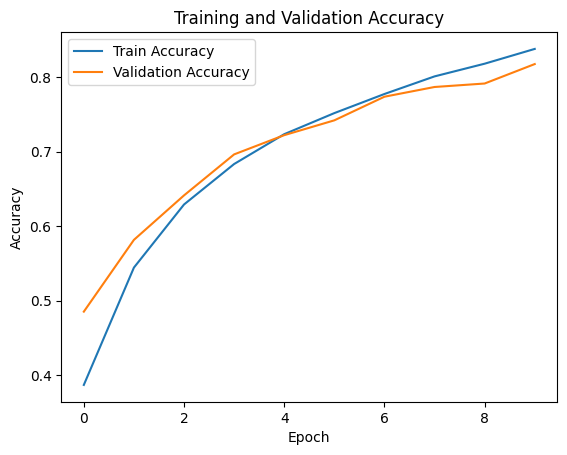

101/101 ━━━━━━━━━━━━━━━━━━━━ 10s 83ms/step - accuracy: 0.8202 - loss: 0.6075
Test Accuracy: 0.82


In [90]:
# Plot training and validation accuracy
import matplotlib.pyplot as plt

plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')
plt.show()

# Evaluate on test data
test_loss, test_accuracy = model.evaluate(val_dataset)
print(f"Test Accuracy: {test_accuracy:.2f}")


In [95]:
! conda install scikit-learn -y

Solving environment: done


==> WARNING: A newer version of conda exists. <==
  current version: 23.9.0
  latest version: 24.11.3

Please update conda by running

    $ conda update -n base -c defaults conda

Or to minimize the number of packages updated during conda update use

     conda install conda=24.11.3



# All requested packages already installed.



1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━

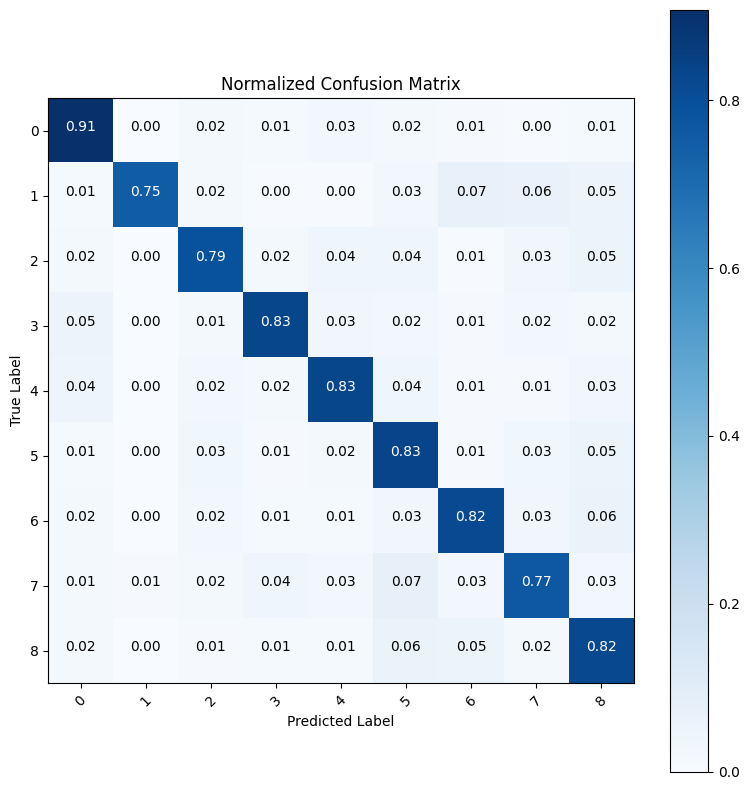

In [99]:
import numpy as np
import matplotlib.pyplot as plt

# Étape 1 : Obtenir les prédictions
true_labels = []
predicted_labels = []

# Parcourez le dataset de validation
for images, labels in val_dataset:
    # Prédictions
    predictions = model.predict(images)
    predicted_classes = np.argmax(predictions, axis=1)  # Classes prédites
    
    # Ajoutez les vraies étiquettes et prédictions
    true_labels.extend(np.argmax(labels.numpy(), axis=1))  # Convertir one-hot en index
    predicted_labels.extend(predicted_classes)

# Step 2: Create the Confusion Matrix
num_classes = len(np.unique(true_labels))
confusion_matrix = np.zeros((num_classes, num_classes), dtype=np.int32)

for t, p in zip(true_labels, predicted_labels):
    confusion_matrix[t, p] += 1


# Step 3: Normalize the Confusion Matrix
# Normalize by dividing each row by the number of instances in the true class
confusion_matrix_normalized = confusion_matrix.astype('float32')
for i in range(num_classes):
    confusion_matrix_normalized[i] /= np.sum(confusion_matrix[i])

# Step 4: Display the Normalized Confusion Matrix
plt.figure(figsize=(8, 8))
plt.imshow(confusion_matrix_normalized, interpolation='nearest', cmap=plt.cm.Blues)
plt.title("Normalized Confusion Matrix")
plt.colorbar()

# Add labels
tick_marks = np.arange(num_classes)
plt.xticks(tick_marks, tick_marks, rotation=45)
plt.yticks(tick_marks, tick_marks)

# Add counts to each cell (proportions)
threshold = confusion_matrix_normalized.max() / 2.
for i in range(num_classes):
    for j in range(num_classes):
        plt.text(j, i, format(confusion_matrix_normalized[i, j], '.2f'),
                 horizontalalignment="center",
                 color="white" if confusion_matrix_normalized[i, j] > threshold else "black")

plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.tight_layout()
plt.show()
